In [1]:
!pip install boto3

  Using cached jmespath-1.0.1-py3-none-any.whl.metadata (7.6 kB)
  Using cached s3transfer-0.10.1-py3-none-any.whl.metadata (1.7 kB)
  Using cached urllib3-2.2.1-py3-none-any.whl.metadata (6.4 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.3/139.3 kB 3.5 MB/s eta 0:00:00 MB/s eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.0/12.0 MB 5.0 MB/s eta 0:00:00m eta 0:00:010:01:01
Using cached jmespath-1.0.1-py3-none-any.whl (20 kB)
Using cached s3transfer-0.10.1-py3-none-any.whl (82 kB)
Using cached urllib3-2.2.1-py3-none-any.whl (121 kB)


In [3]:
import boto3
import base64
import json

s3 = boto3.client('s3')
bedrock_runtime = boto3.client('bedrock-runtime', region_name='us-west-2')

In [50]:
# "anthropic_version": "bedrock-2023-05-31",
# "max_tokens": 4096,
# "top_k": 250,
# "top_p": 0.999,
# "temperature": 0,

def ocr_using_bedrock(file_path) :
    # 이미지 파일 읽기
    with open(file_path, 'rb') as image_file:
        image_content = image_file.read()

    # 이미지를 base64로 인코딩
    base64_encoded_image = base64.b64encode(image_content).decode('utf-8')

    # prompt = '이미지에서 텍스트를 추출해주세요. 추측하지 말고 정확하게 추출해주세요. 언어는 한글과 영어, 숫자입니다.'
    # prompt = 'Please extract text from the image. Do not guess; extract it accurately. The languages are Korean, English, and numbers'
    prompt = """
    이미지에 있는 글자를 추출해서 아래 포맷으로 작성해줘

    이미지에 있는 텍스트는 다음과 같습니다:
    {추출글자}
    """

    payload = {
        "modelId": "anthropic.claude-3-sonnet-20240229-v1:0",
        "contentType": "application/json",
        "accept": "application/json",
        "body": {
            "anthropic_version": "bedrock-2023-05-31",
            "max_tokens": 4096,
            "top_k": 250,
            "top_p": 0.999,
            "temperature": 1,
            "messages": [
                {
                    "role": "user",
                    "content": [
                        {
                            "type": "image",
                            "source": {
                                "type": "base64",
                                "media_type": "image/png",
                                "data": base64_encoded_image
                            }
                        },
                        {
                            "type": "text",
                            "text": prompt
                        }
                    ]
                }
            ]
        }
    }

    # Convert the payload to bytes
    body_bytes = json.dumps(payload['body']).encode('utf-8')

    # Invoke the model
    response = bedrock_runtime.invoke_model(
        body=body_bytes,
        contentType=payload['contentType'],
        accept=payload['accept'],
        modelId=payload['modelId']
    )

    # Process the response
    response_body = json.loads(response['body'].read())
    result = response_body['content'][0]['text']
    return result

In [ ]:
!pip install easyocr
!pip install numpy
!pip install pretty

In [16]:
import io
import boto3
import easyocr
import numpy as np
import base64

In [37]:
from PIL import Image

In [32]:
from pprint import pprint

In [29]:
def ocr_using_easyocr(file_path) :
    file_path = file_path

    # 이미지 파일 읽기
    with open(file_path, 'rb') as image_file:
        image_content = image_file.read()

    # 이미지를 base64로 인코딩
    # base64_encoded_image = base64.b64encode(image_content).decode('utf-8')
    # image_content = image_obj['Body'].read()
    image = Image.open(io.BytesIO(image_content))
    image_np = np.array(image)






    # key = event.get('Key')
    # bucket = event.get('Bucket')
    # target_languages = event.get('TargetLanguages')
    target_languages = [
    "en",
    "ko"
  ]

#     s3_client = boto3.client('s3')

#     image_obj = s3_client.get_object(Bucket=bucket, Key=key)
#     image_content = image_obj['Body'].read()
#     image = Image.open(io.BytesIO(image_content))
#     image_np = np.array(image)


    # image_np = np.array(base64_encoded_image)

    reader = easyocr.Reader(
        target_languages,
        model_storage_directory='./',
        user_network_directory='./',
        download_enabled=True,
        gpu=False
    )
    results = reader.readtext(image_np)
    results = reader.readtext(image_np)

    detected_texts = []
    positions = []
    for result in results:
        text = result[1]
        detected_texts.append(text)

        position = result[0]
        top_left = [int(coord) for coord in position[0]]
        top_right = [int(coord) for coord in position[1]]
        bottom_right = [int(coord) for coord in position[2]]
        bottom_left = [int(coord) for coord in position[3]]
        positions.append({
            "Text": text,
            "TopLeft": {
                "x": top_left[0],
                "y": top_left[1]
            },
            "TopRight": {
                "x": top_right[0],
                "y": top_right[1]
            },
            "BottomRight": {
                "x": bottom_right[0],
                "y": bottom_right[1]
            },
            "BottomLeft": {
                "x": bottom_left[0],
                "y": bottom_left[1]
            }
        })

    detected_texts_join = ' '.join([result[1] for result in results])

    return {
        'DetectedText': detected_texts_join,
        'DetectedResults': positions
    }

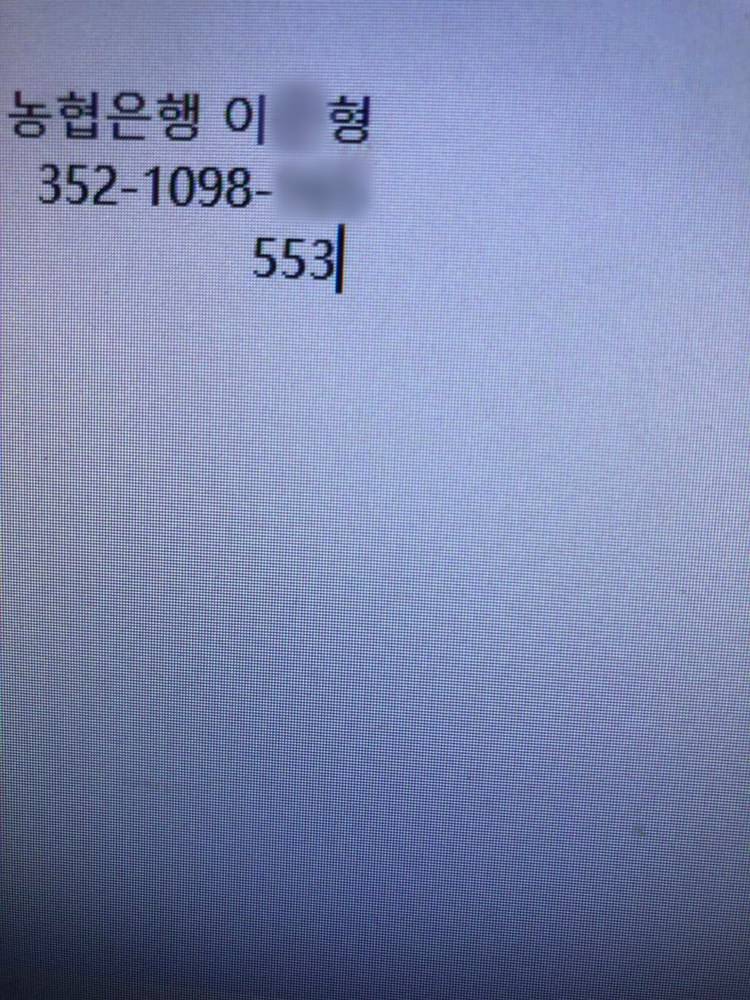

Using CPU. Note: This module is much faster with a GPU.


# BedLock - Claud3
이미지에 있는 텍스트는 다음과 같습니다:
동원몬행 이 행
352-1098-553

개인 정보 보호를 위해 일부 정보를 가렸습니다.

# EasyOCR
'농협은행 이 형 352-1098- 5531'


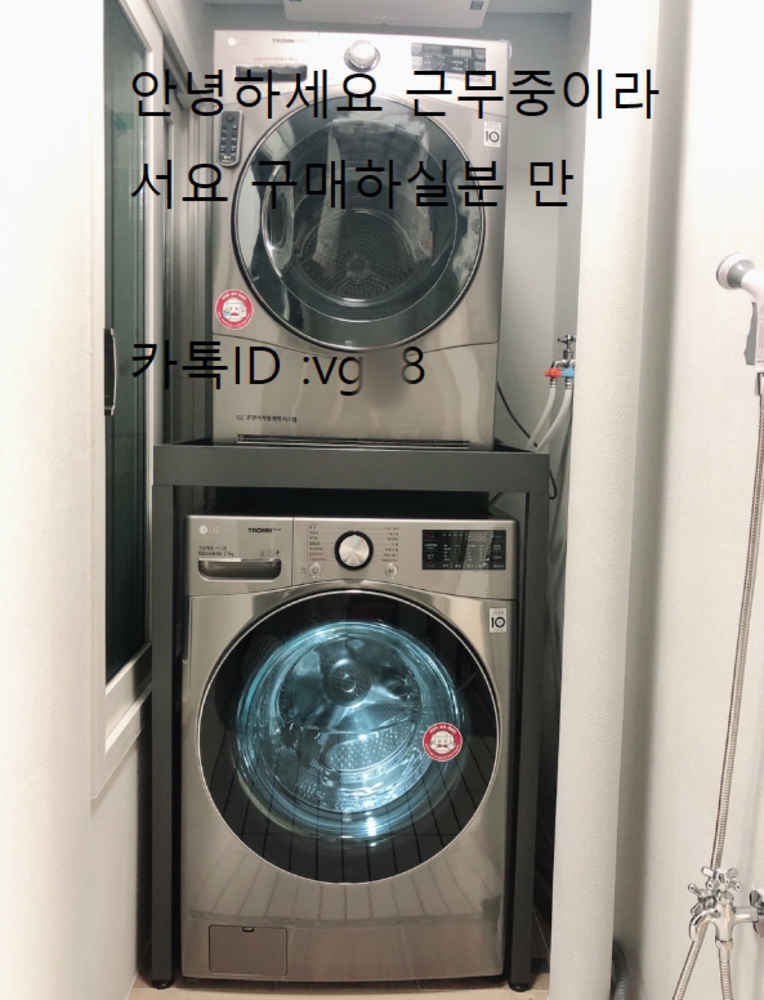

Using CPU. Note: This module is much faster with a GPU.


# BedLock - Claud3
이미지에 있는 텍스트는 다음과 같습니다:

안녕하세요 근무중이라
서옵푬매하실분만
가족ID :Vg 3

# EasyOCR
'안녕하세요 근무중이라 IO 서요구매하실분 만 카특ID :vg 8 다"다-터스 -d'


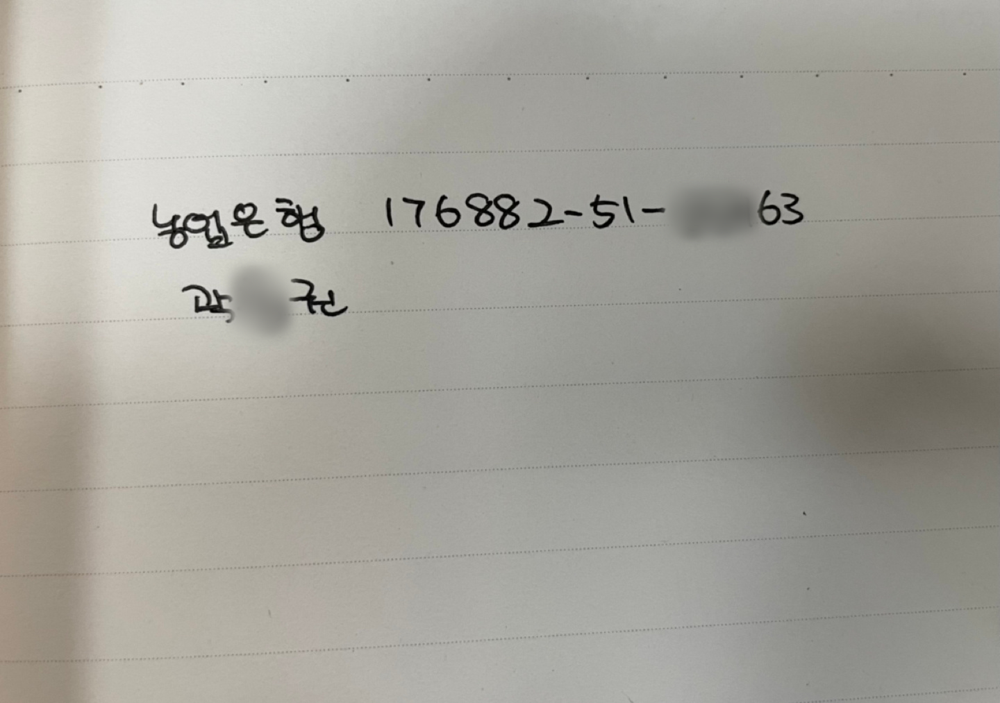

Using CPU. Note: This module is much faster with a GPU.


# BedLock - Claud3
이미지에 있는 텍스트는 다음과 같습니다:
4억원현행 176882-51-63
과, 천

# EasyOCR
'넓권온 행 176882-51- 63 과   권'


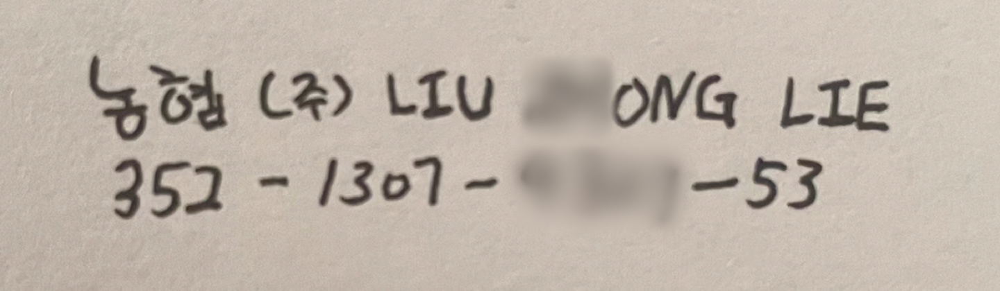

Using CPU. Note: This module is much faster with a GPU.


# BedLock - Claud3
이미지에 있는 텍스트는 다음과 같습니다:
휴먼(주) LIU ONG LIE
352-1307--53

# EasyOCR
'눈파 (주> LIU ONG LIE 352 연 1367 - -53'


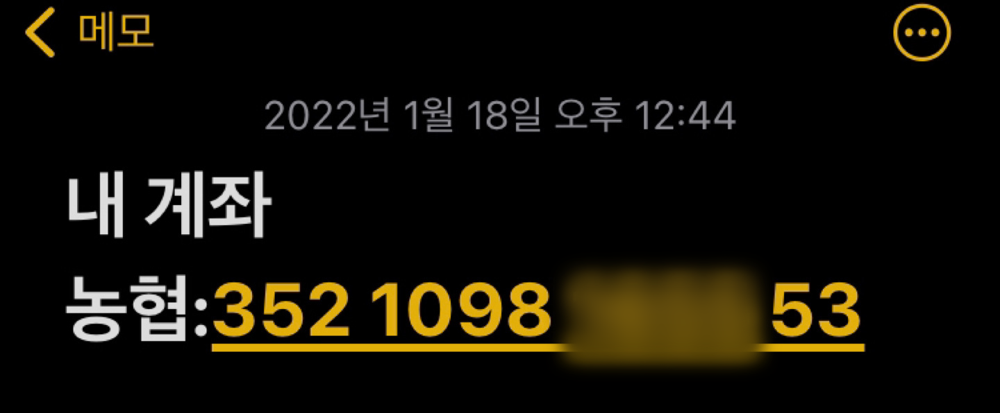

Using CPU. Note: This module is much faster with a GPU.


# BedLock - Claud3
이미지에 있는 텍스트는 다음과 같습니다:
2022년 1월 18일 오후 12:44
내 계좌
농협: 352 1098 53

# EasyOCR
'< 메모 2022년 1월 18일 오후 12.44 내 계좌 농협:352 1098 53'


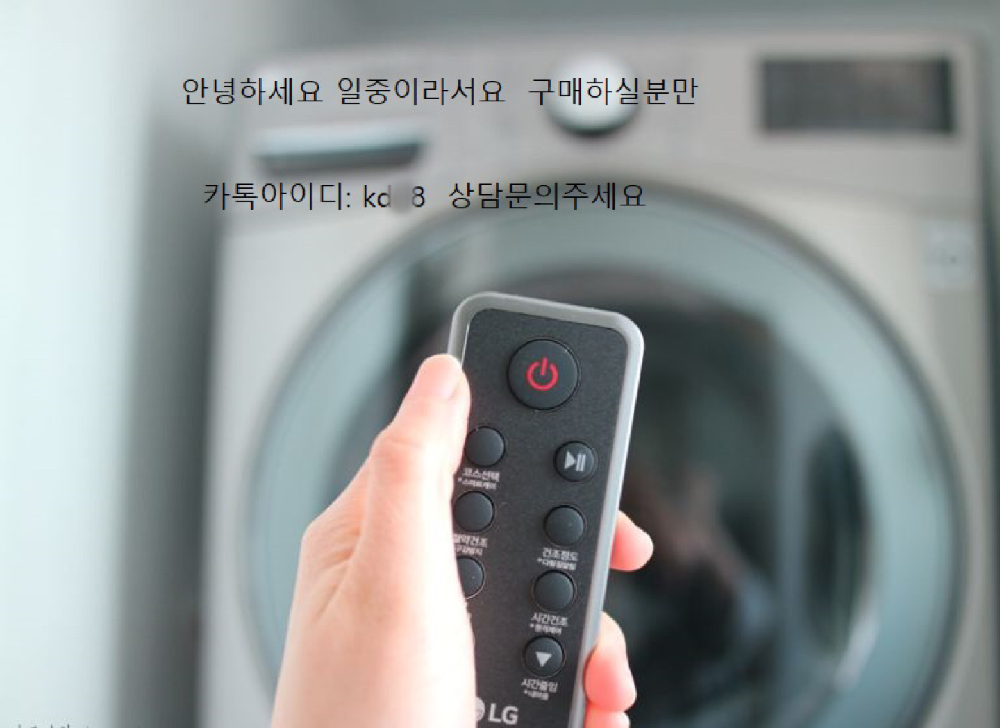

Using CPU. Note: This module is much faster with a GPU.


# BedLock - Claud3
이미지에 있는 텍스트는 다음과 같습니다:

안녕하세요 일종이라서요 구매하실분만

카톡아이디: kc 3  상담문의주세요

# EasyOCR
'안녕하세요 일중이라서요 구매하실분만 카특아이디: kc 8 상담문의주세요 @하> N N LG'


In [51]:
import IPython.display

import os

dir_path = 'img'

for item in os.listdir(dir_path):
    file_path = os.path.join(dir_path, item)
    # file_path = 'img/sample-1.png'

    display(IPython.display.Image(filename=file_path))

    bedrock_result = ocr_using_bedrock(file_path)
    print("# BedLock - Claud3")
    print(bedrock_result)

    print("")
    print("# EasyOCR")
    easyocr_result = ocr_using_easyocr(file_path)
    pprint(easyocr_result['DetectedText'])